<a href="https://colab.research.google.com/github/jessysu/attnmod/blob/main/AttnMod_SDXL_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install

In [ ]:
# Other versions of diffusers might work. Try at your own risk
!pip install diffusers==0.30.2
!git clone https://github.com/jessysu/attnmod
%cd attnmod

# Default Huggingface SDXL diffuser output

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

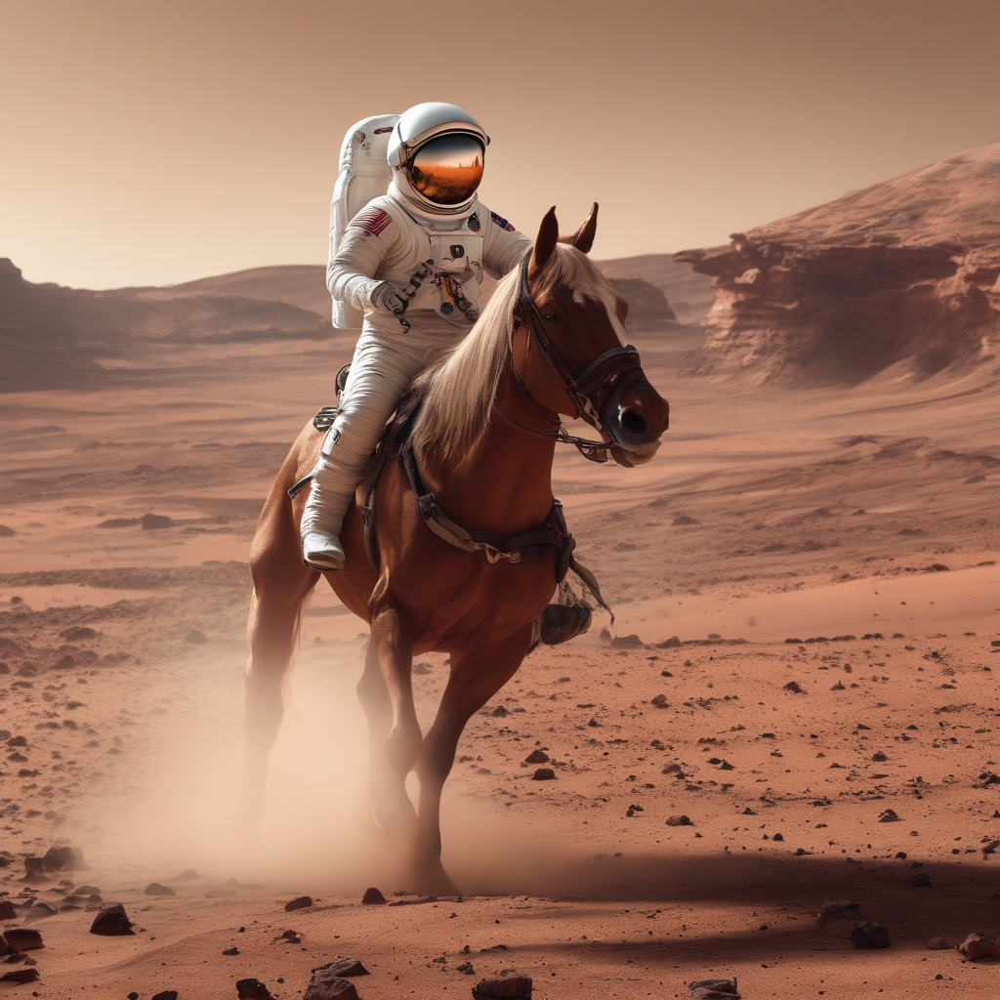

In [4]:
import torch
from attnmod import AttnModXLPipeline

pipe = AttnModXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16
)
pipe = pipe.to("cuda")

prompt = "a photo of an astronaut riding a horse on mars"
generator = torch.Generator(device="cpu").manual_seed(0)
image = pipe(prompt, generator=generator).images
image[0]

# AttnMod

  0%|          | 0/50 [00:00<?, ?it/s]

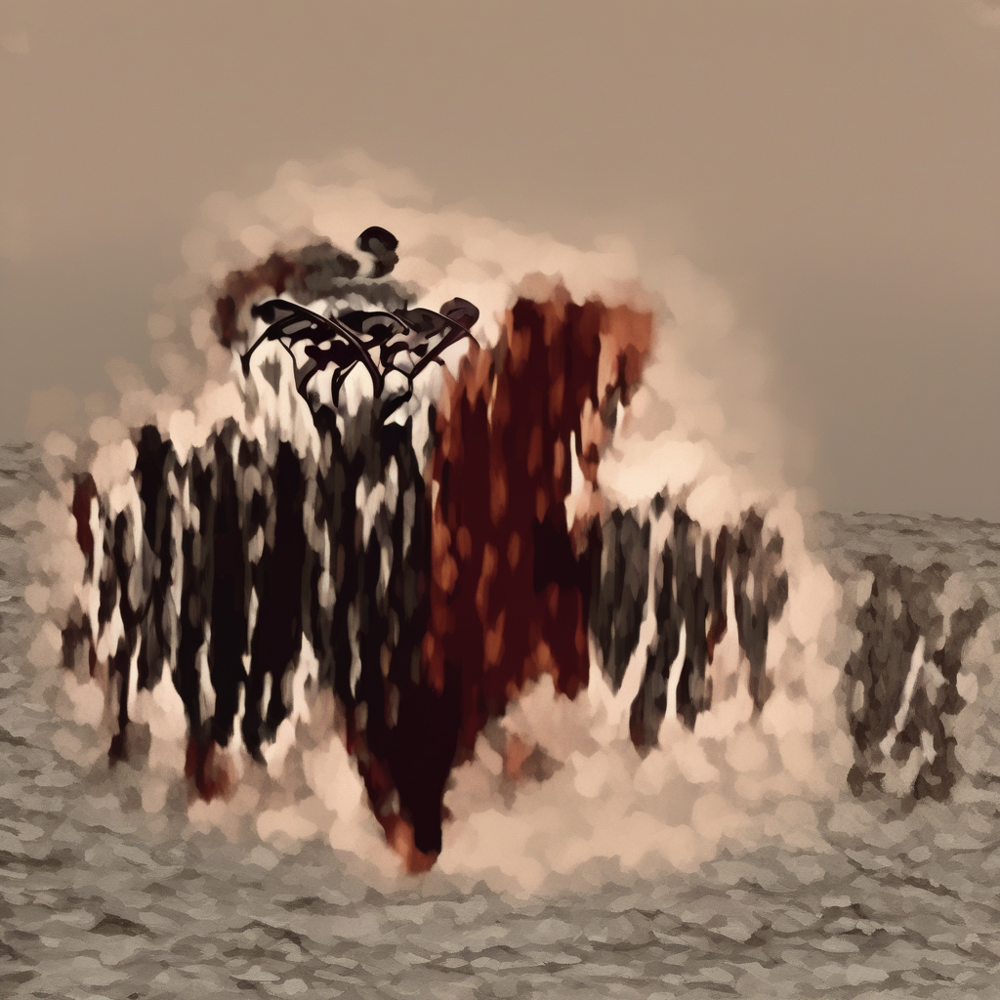

In [5]:
attnmod = {
    'up_blocks.0.attentions.0.transformer_blocks.8.attn1.processor': {"start": -50, "increment": 0},
}

generator = torch.Generator(device="cpu").manual_seed(0)
image = pipe(prompt, generator=generator, attnmod=attnmod,).images
image[0]


  0%|          | 0/50 [00:00<?, ?it/s]

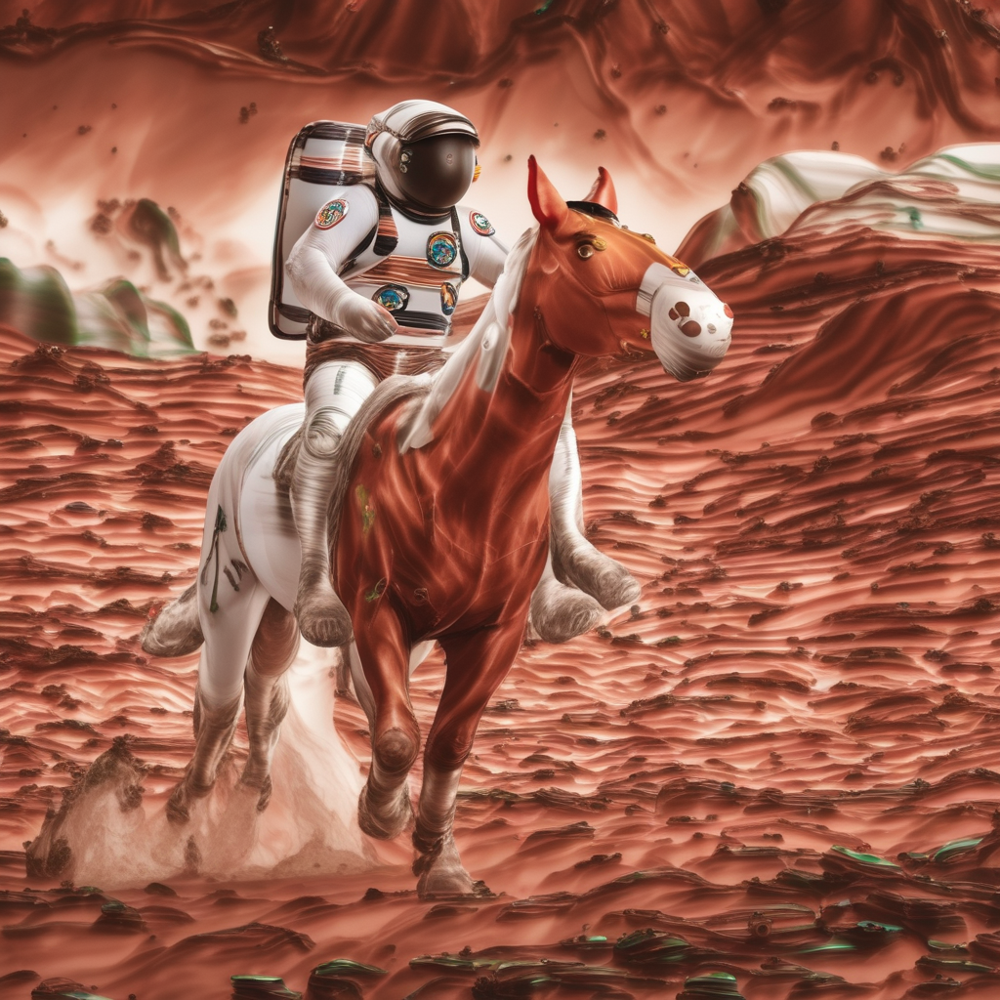

  0%|          | 0/50 [00:00<?, ?it/s]

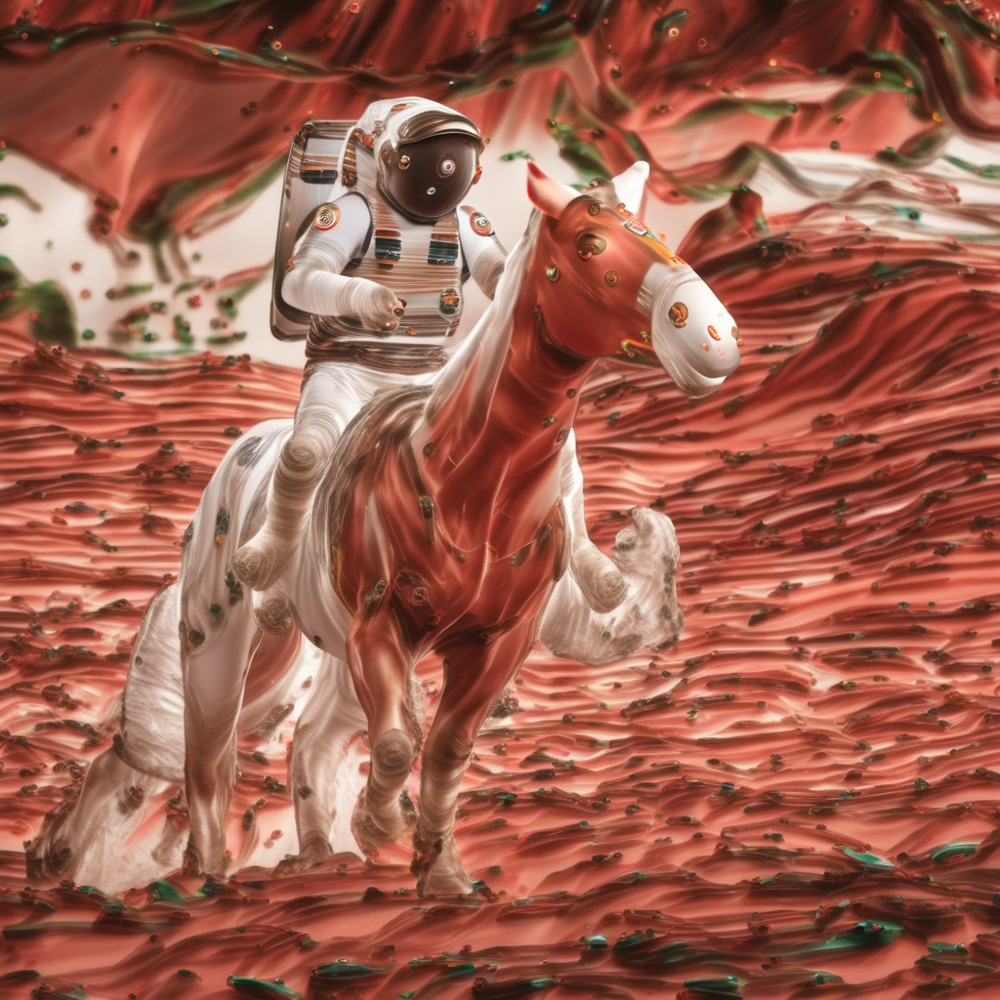

  0%|          | 0/50 [00:00<?, ?it/s]

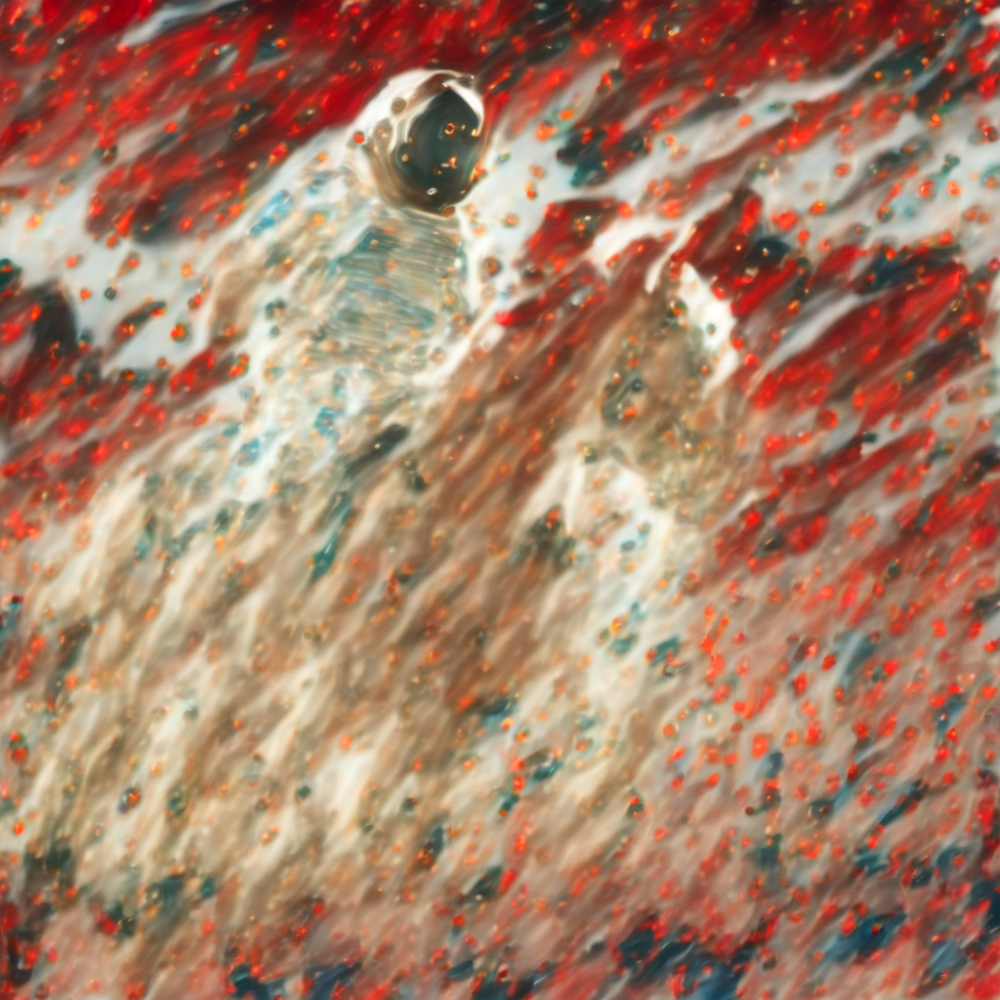

In [6]:
for increment in [0.5, 1, 5]:
  prompt = "a photo of an astronaut riding a horse on mars"
  generator = torch.Generator(device="cpu").manual_seed(0)
  attnmod = {
    'up_blocks.0.attentions.1.transformer_blocks.4.attn2.processor': {"start": 20, "increment": increment},
  }
  image = pipe(prompt, generator=generator, attnmod=attnmod).images
  display(image[0])


# Pick the block(s) you like

In [7]:
pipe.unet.attn_processors.keys()

dict_keys(['down_blocks.1.attentions.0.transformer_blocks.0.attn1.processor', 'down_blocks.1.attentions.0.transformer_blocks.0.attn2.processor', 'down_blocks.1.attentions.0.transformer_blocks.1.attn1.processor', 'down_blocks.1.attentions.0.transformer_blocks.1.attn2.processor', 'down_blocks.1.attentions.1.transformer_blocks.0.attn1.processor', 'down_blocks.1.attentions.1.transformer_blocks.0.attn2.processor', 'down_blocks.1.attentions.1.transformer_blocks.1.attn1.processor', 'down_blocks.1.attentions.1.transformer_blocks.1.attn2.processor', 'down_blocks.2.attentions.0.transformer_blocks.0.attn1.processor', 'down_blocks.2.attentions.0.transformer_blocks.0.attn2.processor', 'down_blocks.2.attentions.0.transformer_blocks.1.attn1.processor', 'down_blocks.2.attentions.0.transformer_blocks.1.attn2.processor', 'down_blocks.2.attentions.0.transformer_blocks.2.attn1.processor', 'down_blocks.2.attentions.0.transformer_blocks.2.attn2.processor', 'down_blocks.2.attentions.0.transformer_blocks.3.at

# Happy modding